In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.subplots as sp
import plotly.io as pio

from scipy.stats import gaussian_kde
import statsmodels.api as sm # to build a LOWESS model
import matplotlib.pyplot as plt

# subplot titles
def make_subplot_titles(sample_names):
    subplot_titles = []
    num_samples = len(sample_names)
    for i in range(num_samples):
        for j in range(num_samples):
            if i == j:
                subplot_titles.append(f'{sample_names[i]}')
            else:
                subplot_titles.append(f'{sample_names[i]} vs. {sample_names[j]}')
    return subplot_titles

def densities(x, y):
    values = np.vstack([x, y])
    return gaussian_kde(values)(values)

def movingaverage(data, window_width):
    cumsum_vec = np.cumsum(np.insert(data, 0, 0)) 
    ma_vec = (cumsum_vec[window_width:] - cumsum_vec[:-window_width]) / window_width
    return ma_vec

def update_max(current, values):
    return max(current, np.max(values))

def get_indices(num_samples, num_cols, plot_num):
    i = plot_num // num_samples
    j = plot_num % num_samples
    col = plot_num % num_cols + 1
    row = plot_num // num_cols + 1
    return i,j,col,row

def create_subplot_data(frac, it, num_bins, window_width, samples, i, j):
    subplot_data = {}    
    subplot_data["mean"] = np.log(samples.iloc[:, [i, j]].mean(axis=1))    
    if i == j:
        counts, bins = np.histogram(subplot_data["mean"], bins=num_bins)
        subplot_data["bins"] = bins
        subplot_data["counts"] = counts
        subplot_data["counts_smoothed"] = movingaverage(counts, window_width)
        subplot_data["max_counts"] = np.max(counts)
    else:
        subplot_data["log_fold_change"] = np.log2(samples.iloc[:, i] / samples.iloc[:, j])
        subplot_data["max_log_fold_change"] = np.max(subplot_data["log_fold_change"])
        subplot_data["densities"] = densities(subplot_data["mean"], subplot_data["log_fold_change"])
        subplot_data["regression"] = sm.nonparametric.lowess(subplot_data["log_fold_change"], subplot_data["mean"], frac=frac, it=it)
    return subplot_data

def create_plot_data(frac, it, num_bins, window_width, samples, num_samples, num_plots, num_cols):
    plots_data = []
    for plot_num in range(num_plots):
        i, j, _, _ = get_indices(num_samples, num_cols, plot_num)
        subplot_data = create_subplot_data(frac, it, num_bins, window_width, samples, i, j)
        plots_data.append(subplot_data)
    return plots_data

In [ ]:
# Data input
file_path = 'test-data/ma_plot_testdata_4.csv'

# LOESS Smoothing Parameters
frac = 4/5
it = 5

# hist params
num_bins = 100
window_width = 5


# Plotting parameters
size = 500
scale = 3
y_scale_factor = 1.1
max_num_cols = 100
interactive = False

# Load the data
data = pd.read_csv(file_path)
features = data.iloc[:, 0]  # Assuming the first column is the feature names 
samples = data.iloc[:, 1:]  # and the rest are samples

# Create a subplot figure
num_samples = samples.shape[1]
sample_names = samples.columns
num_plots = num_samples ** 2
num_cols = min(num_samples, max_num_cols)
num_rows = int(np.ceil(num_plots / num_cols))

plots_data = create_plot_data(frac, it, num_bins, window_width, samples, num_samples, num_plots, num_cols)

count_max = np.max([x.get('max_counts', 0) for x in plots_data])
log_fold_change_max = np.max([x.get('max_log_fold_change', 0) for x in plots_data])

ylim_hist = count_max * y_scale_factor
ylim_ma = log_fold_change_max * y_scale_factor

In [6]:
def ma_plots_plotly(num_rows, num_cols, num_plots, plots_data, sample_names, size, ylim_hist, ylim_ma):
    fig = sp.make_subplots(
        rows=num_rows,
        cols=num_cols,
        shared_xaxes = "all",
        subplot_titles=make_subplot_titles(sample_names)
    )

    for plot_num in range(num_plots):
        i, j, col, row = get_indices(num_samples, num_cols, plot_num)
        subplot_data = plots_data[plot_num]

        mean = subplot_data["mean"]

        if i == j:
            # Plot histogram on the diagonal
            hist_bar = go.Bar(
                x=subplot_data["bins"],
                y=subplot_data["counts"],
            )
            fig.add_trace(hist_bar, row=row, col=col)

            hist_line = go.Scatter(
                x=subplot_data["bins"],
                y=subplot_data["counts_smoothed"],
                marker=dict(
                    color="red",
                ),
            )
            fig.add_trace(hist_line, row=row, col=col)
            fig.update_yaxes(title_text="Counts", range=[0, ylim_hist], matches="y1", showticklabels=True, row=row, col=col)
        else:
            log_fold_change = subplot_data["log_fold_change"]
            scatter = go.Scatter(
                x=mean, 
                y=log_fold_change, 
                mode='markers',
                marker=dict(
                    color=subplot_data['densities'],
                    symbol='circle',
                    colorscale="jet"
                ),
                name=f'{sample_names[i]} vs {sample_names[j]}',
                text=features,
                hovertemplate='<b>%{text}</b><br>Log Mean: %{x}<br>Log2 Fold Change: %{y}<extra></extra>',
            )
            fig.add_trace(scatter, row=row, col=col)


            regression = subplot_data["regression"]
            line = go.Scatter(
                x=regression[:, 0],
                y=regression[:, 1],
                mode='lines',
                line=dict(color='red'),
                name=f'LOWESS {sample_names[i]} vs. {sample_names[j]}'
            )
            fig.add_trace(line, row=row, col=col)

            fig.update_yaxes(title_text="Log2 Fold Change", range=[-ylim_ma, ylim_ma], matches="y2", showticklabels=True, row=row, col=col)
        fig.update_xaxes(title_text='Log Mean Intensity', showticklabels=True, row=row, col=col)


    # Update layout for the entire figure
    fig.update_layout(
        height=size*num_rows,
        width=size*num_cols,
        showlegend=False,
        template='simple_white'  # Apply the 'plotly_white' template
    )
    return fig

In [10]:
def ma_plots_matplotlib(num_rows, num_cols, num_plots, pots_data, sample_names, size, ylim_hist, ylim_ma):
    subplot_titles = make_subplot_titles(sample_names)
    fig, axes = plt.subplots(
        num_rows,
        num_cols,
        figsize=(size*num_cols/100, size*num_rows/100),
        dpi=300,
        sharex='all'
    )
    axes = axes.flatten()

    for plot_num in range(num_plots):
        i, j, _, _ = get_indices(num_samples, num_cols, plot_num)
        subplot_data = pots_data[plot_num]

        mean = subplot_data["mean"]

        ax = axes[plot_num]

        if i == j:
            # Plot histogram on the diagonal
            ax.bar(subplot_data['bins'][:-1], subplot_data['counts'], width=np.diff(subplot_data['bins']), edgecolor="black", align="edge")

            # Plot moving average line
            ax.plot(subplot_data['bins'][window_width//2:-window_width//2], subplot_data['counts_smoothed'], color="red")

            ax.set_ylabel("Counts")
            ax.set_ylim(0, ylim_hist)
        else:
            # Scatter plot
            ax.scatter(
                mean, 
                subplot_data["log_fold_change"], 
                c=subplot_data['densities'],
                cmap="jet",
                edgecolor='black',
                label=f'{sample_names[i]} vs {sample_names[j]}'
            )

            # Regression line
            regression = subplot_data["regression"]
            ax.plot(regression[:, 0], regression[:, 1], color='red', label=f'LOWESS {sample_names[i]} vs. {sample_names[j]}')

            ax.set_ylabel("Log2 Fold Change")
            ax.set_ylim(-ylim_ma, ylim_ma)

        ax.set_xlabel('Log Mean Intensity')
        ax.tick_params(labelbottom=True)  # Force showing x-tick labels
        ax.set_title(subplot_titles[plot_num])  # Add subplot title

    # Adjust layout
    plt.tight_layout()
    return fig

In [7]:
fig = ma_plots_plotly(num_rows, num_cols, num_plots, plots_data, sample_names, size, ylim_hist, ylim_ma)
fig.show()

In [8]:
fig.write_html("ma_plot.html")

In [75]:
format = 'pdf'
pio.write_image(fig, f'ma_plot.{format}', format=format, width= size * num_cols, height= size * num_rows, scale=scale)  # 300 DPI (7 inches * 100 pixels per inch * 3)

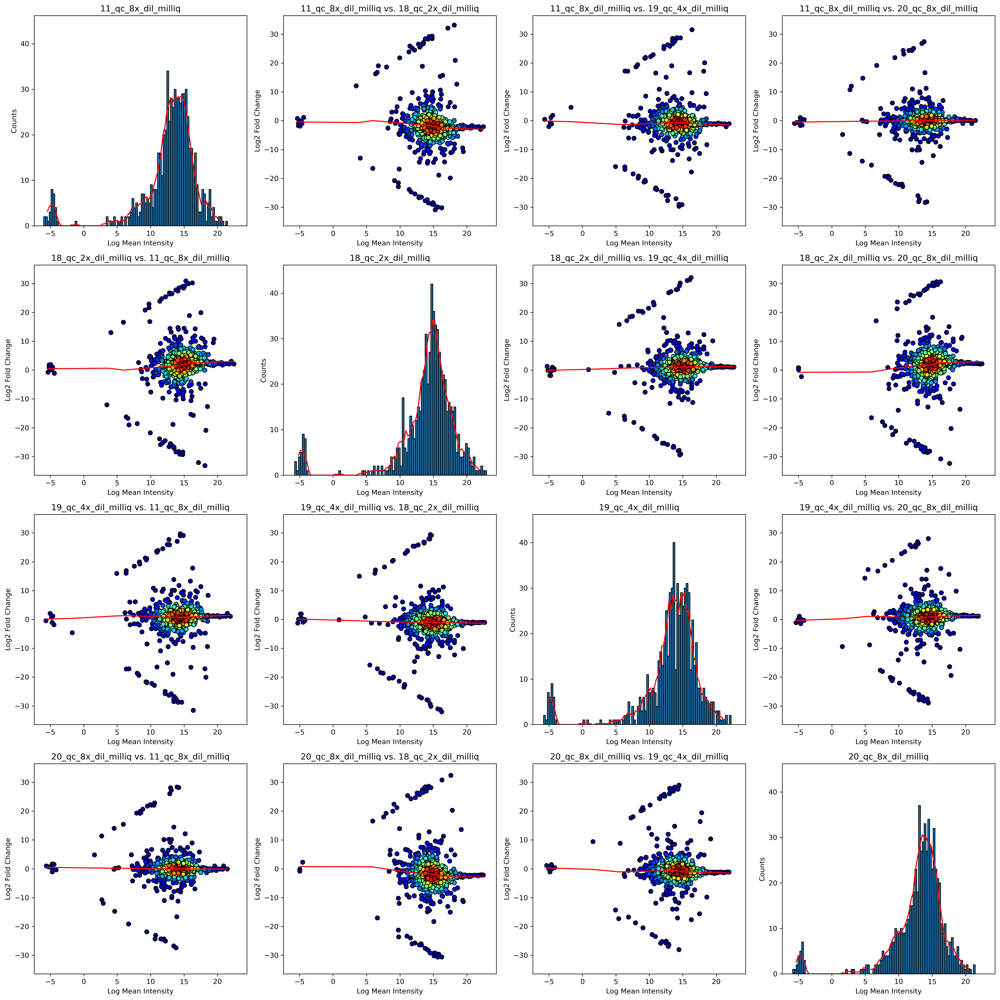

In [11]:
# Example usage
fig = ma_plots_matplotlib(num_rows, num_cols, num_plots, plots_data, sample_names, size, ylim_hist, ylim_ma)
plt.show()

Make Galaxy tool accept a column select and create a loading action which provides only the selected columns for the df